# MicrostructureNoise

## Introduction

(Available as Jupyter notebook at https://github.com/mschauer/MicrostructureNoise.jl/blob/master/example/MicrostructureNoise.ipynb)

`MicrostructureNoise` is a Julia package for Bayesian volatility estimation in presence of market microstructure noise implementing the methodology described in our new preprint: 

* Shota Gugushvili, Frank van der Meulen, Moritz Schauer, and Peter Spreij: Nonparametric Bayesian volatility learning under microstructure noise. [arxiv:1805.05606](https://arxiv.org/abs/1805.05606), 2018.

This blogpost gives a short introduction.


### Description

MicrostructureNoise estimates the volatility function $s$ of the stochastic differential equation

$dX_t = b(t,X_t) dt + s(t) dW_t, \quad X_0 = x_0, \quad t \in [0,T]$

from noisy observations of its solution

$Y_i = X(t_i) + V_i, \quad 0 < t_1 < \ldots < t_n = T$

where $\{V_i\}$ denote unobservable stochastic disturbances. The method is minimalistic in its assumptions on the volatility function, which in particular can itself be a stochastic process.

The estimation methodology is intuitive to understand, given that its ingredients are well-known statistical techniques. The posterior inference is performed via the Gibbs sampler, with the Forward Filtering Backward Simulation algorithm used to reconstruct unobservable states $X(t_i)$. This relies on the Kalman filter. The unknown squared volatility function is a priori modelled as piecewise constant and is assigned the inverse Gamma Markov chain prior, which induces smoothing among adjacent pieces of the function. Next to yielding point estimates (e.g. the posterior mean), the method conducts automatic uncertainty quantification via marginal credible bands.


### Setup

Install `MicrostructureNoise` via the package manager. 
```
using Pkg
Pkg.add("MicrostructureNoise")
```
Then load the packages below.

In [1]:
using MicrostructureNoise, Distributions, Plots
using Random, Dates, LinearAlgebra, DelimitedFiles
Random.seed!(12);

## Real data example

As a first example, we apply our methodology to infer volatility of the high frequency foreign exchange rate data made available by Pepperstone Limited, the London based forex broker (https://pepperstone.com/uk/client-resources/historical-tick-data). Specifically, we use the EUR/USD tick data (bid prices) for 2 March 2015. We retrieve, log-transform and subsample the data and express time in milliseconds.

In [2]:
# uncomment if you do not mind to create this large file 
# Base.download("https://www.truefx.com/dev/data//2015/MARCH-2015/EURUSD-2015-03.zip","./data/EURUSD-2015-03.zip")
# run(`unzip ./data/EURUSD-2015-03.zip -d ./data`)
dat = readdlm("../data/EURUSD-2015-03.csv", ',')
times = map(a -> DateTime(a, "yyyymmdd H:M:S.s"), dat[1:10:130260,2])
t = Float64[1/1000*(times[i].instant.periods.value-times[1].instant.periods.value) for i in 1:length(times)]
n = length(t)-1
T = t[end]
y = log.(Float64.(dat[1:10:130260, 3]));

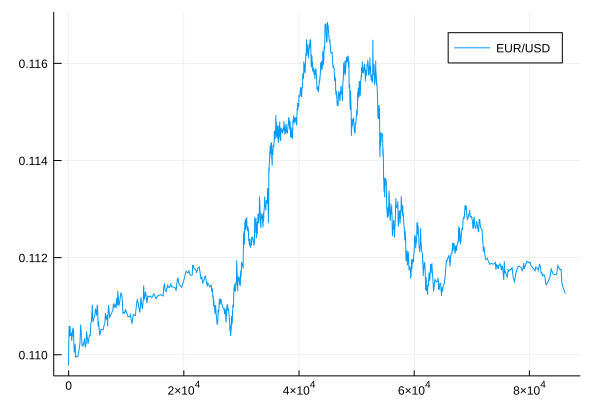

In [3]:
plot(t[1:10:end], y[1:10:end], label="EUR/USD")

The prior specification is done via the `Prior` struct.

In [4]:
prior = MicrostructureNoise.Prior(
N = 40,

α1 = 0.0,
β1 = 0.0,

αη = 0.01, 
βη = 0.01,

Πα = LogNormal(1., 0.5),
μ0 = 0.0,
C0 = 5.0
);

Most importantly, we set the number of bins `N`. A second import choice is the hyper-prior of the smoothing parameter `Πα`. The technical meaning of the other parameter is explained in our paper.

We now sample the posterior using MCMC.

In [5]:
α = 0.3 # Initial smoothness hyperparameter guess
σα = 0.1 # Random walk step size for smoothness hyperparameter

td, θs, ηs, αs, p = MicrostructureNoise.MCMC(prior, t, y, α, σα, 1500, printiter=500);

500 	 α 5.380198810926286✓	 √η0.0012652754686380354
1000 	 α 3.16338362080358✓	 √η0.0012521276380185386
1500 	 α 3.7936135928197197✓	 √η0.0012511601322496369


The inline help gives a synopsis of the function `MCMC` (and other functions).

In [6]:
?MicrostructureNoise.MCMC

```
MCMC(Π::Union{Prior,Dict}, t, y, α0::Float64, σα, iterations; 
    subinds = 1:1:iterations, η0::Float64 = 0.0, printiter = 100,
    fixalpha = false, fixeta = false, skipfirst = false) -> td, θ, ηs, αs, pacc
```

Run the Markov Chain Monte Carlo procedure for `iterations` iterations, on data `(t, y)`, where `t` are observation times and `y` are observations. `α0` is the initial guess for the smoothing parameter `α` (necessary), `η0` is the initial guess for the noise variance (optional), and `σα` is the stepsize for the random walk proposal for `α`.

Prints verbose output every `printiter` iteration.

Returns `td, θs, ηs, αs, pacc`, `td` is the time grid of the bin boundaries, `ηs`, `αs` are vectors of iterates, possible subsampled at indices `subinds`, `θs` is a Matrix with iterates of `θ` rows. `paccα` is the acceptance probability for the update step of `α`.

`y[i]` is the observation at `t[i]`.

If `skipfirst = true` and `t` and `y` are of equal length, the observation `y[1]` (corresponding to `t[1]`) is ignored.

If `skipfirst = true` and `length(t) = length(y) + 1`,  `y[i]` is the observation at `t[i + 1]`.

Keyword args `fixalpha`, `fixeta` when set to `true` allow fixing `α` and `η` at their initial values. 


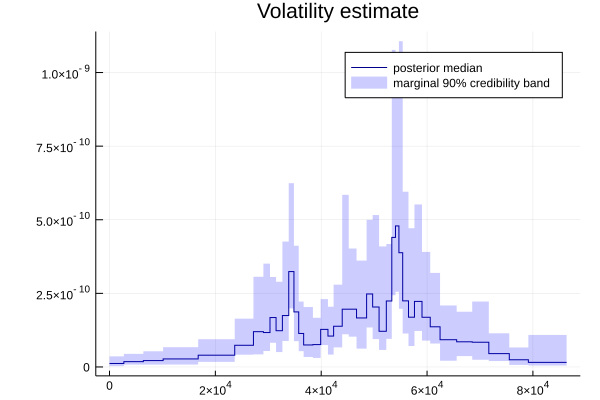

In [7]:
posterior = MicrostructureNoise.posterior_volatility(td, θs)

tt, mm = MicrostructureNoise.piecewise(posterior.post_t, posterior.post_median[:])

plot(tt, mm, label="posterior median", color="dark blue")
plot!(MicrostructureNoise.piecewise(posterior.post_t, posterior.post_qlow[:])...,
    fillrange = MicrostructureNoise.piecewise(posterior.post_t, posterior.post_qup[:])[2], 
    fillalpha = 0.2,
    alpha = 0.0,
    fillcolor="blue",
    title="Volatility estimate", label="marginal $(round(Int,posterior.qu*100))% credibility band")


A histogram of `sqrt.(ηs)` visualises the posterior of the observation error `η`, indicating that there is indeed a non-negligible microstructure noise.

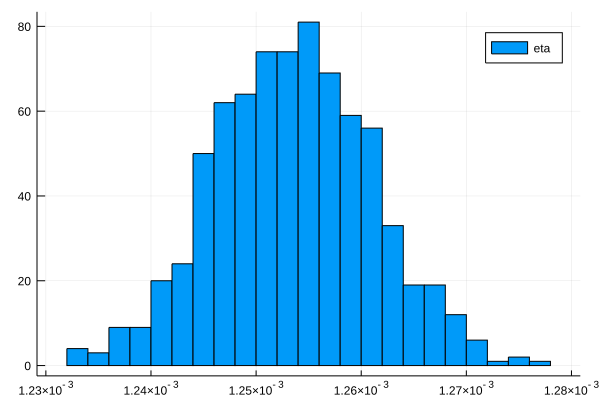

In [8]:
histogram(sqrt.(ηs[end÷2:end]), nbins=20, label="eta")

## How good does it work: Test with the Heston model

In order to test our model, we simulate a trajectory of an asset following the Heston model (https://en.wikipedia.org/wiki/Heston_model).

The Heston model is  a widely used stochastic volatility model where it is assumed that the price process of a certain asset, denoted by $S$, evolves over time according to the SDE
$$
d S_t = \mu S_t d t + \sqrt{Z_t } S_t d W_t,
$$
where the process $Z$ follows the CIR or square root process,
$$
d Z_t = \kappa ( \theta - Z_t ) d t + \sigma \sqrt{Z_t} d B_t.
$$
Here $W$ and $B$ are correlated Wiener processes with correlation $\rho$.

For this generated asset price trajectory we can compare our volatility estimate from noisy data with the true volatility known from the simulation.

### Generate data from the Heston model

To define the model in Julia and to simulate the trajectory use the package `Bridge`.
Install it via the package manager. 
```
Pkg.add("Bridge")
```
Usually we would not perform inference with $S$, but with its logarithm $X_t=\log S_t$. However, we simulate $S$ directly.

In [9]:
using Bridge
using StaticArrays
const R2 = SVector{2,Float64};

In [10]:
struct Heston <: ContinuousTimeProcess{R2}
    mu::Float64
    kappa::Float64
    theta::Float64
    sigma::Float64
end
Heston(;mu = NaN, kappa = NaN, theta = NaN, sigma = NaN) = Heston(mu, kappa, theta, sigma)

Heston

Define the drift $b$ and the dispersion coefficient $\sigma$ of the process.

In [11]:
Bridge.b(s, x, P::Heston) = R2(P.mu*x[1], P.kappa*(P.theta - x[2]))
Bridge.σ(s, x, P::Heston) = Diagonal(R2(sqrt(x[2])*x[1], P.sigma*sqrt(x[2])))

We choose the following setting, where the parameter values match what one may expect with real data.

In [12]:
T = 1.0
n = 4000
P = Heston(mu = 0.02, kappa = 7.0, theta = 0.04, sigma = 0.6)

Heston(0.02, 7.0, 0.04, 0.6)

The process is first simulated on a fine grid and next subsampled at $n=4000$ random time points. Here we define these grids. Random sampling creates a non-uniform grid, which is what one typically sees with real financial data, where observations are not equispaced in time.

In [13]:
nf = 10 # generate the process on a finer grid than it is observed

tfine0 = T .* sort(rand(n*nf-1))
tfine = [0.0; tfine0; T]

is = [i <= n-1 for i in 1:length(tfine)-2]
is = [true; is[randperm(length(is))]; true]
t = tfine[is];
    

Now we generate a sample path with the Euler scheme from correlated Brownian motions, and $\log$-transform and subsample the data. By Itô's formula we know the true volatility of the log-transformed process $S$ is in fact the process $Z$.

In [14]:
u = R2(1., P.theta)
W = sample(tfine, Wiener{R2}())
ρ = -0.6
map!(v->R2(v[1], ρ*v[1] + sqrt(1-ρ^2)v[2]), W.yy, W.yy) # correlate Brownian motions

Xfine = solve(EulerMaruyama(), u, W, P)

xtrue = log.(first.(Xfine.yy[is]))
s0(t) = sqrt(Xfine.yy[searchsortedfirst(Xfine.tt, t)][2])
y = copy(xtrue) 

η0 = 0.005^2
y .+= randn(n + 1) * sqrt(η0);


### Perform inference using `MicrostructureNoise`.

This proceeds along the same lines as before.

In [15]:
α = 5.0 # Initial smoothness hyperparameter guess
σα = 3.0 # Random walk step size for smoothness hyperparameter

td, θs, ηs, αs, p = MicrostructureNoise.MCMC(prior, t, y, α, σα, 10000, printiter=500);

println("acceptance probability $p")

500 	 α 8.566508090289846✓	 √η0.005617280092842119
1000 	 α 9.815065924306115✓	 √η0.005629023405031323
1500 	 α 10.985403397118322	 √η0.005579285416494375
2000 	 α 12.89451174087447	 √η0.005686014905040823
2500 	 α 7.601611505712467✓	 √η0.0055683851072433985
3000 	 α 8.09906935072442✓	 √η0.005566196324065796
3500 	 α 6.03528648368887✓	 √η0.005722599569239399
4000 	 α 9.071874041483653✓	 √η0.005599092702595944
4500 	 α 9.894933503390128	 √η0.005719570777334117
5000 	 α 10.404731432491559	 √η0.005581412152135005
5500 	 α 4.37237232386469	 √η0.005584796385849964
6000 	 α 10.66803281085502✓	 √η0.005708681341088976
6500 	 α 9.548599293560805✓	 √η0.0056263659312599966
7000 	 α 6.6426058814117575	 √η0.005732220011624076
7500 	 α 3.783478357418007	 √η0.0056901013766834894
8000 	 α 2.180373831264256	 √η0.005755762757355612
8500 	 α 6.618894889556513✓	 √η0.005772539224098141
9000 	 α 10.12991618656203	 √η0.005709126889941856
9500 	 α 11.114499798494625✓	 √η0.005801657072264518
10000 	 α 12.20334

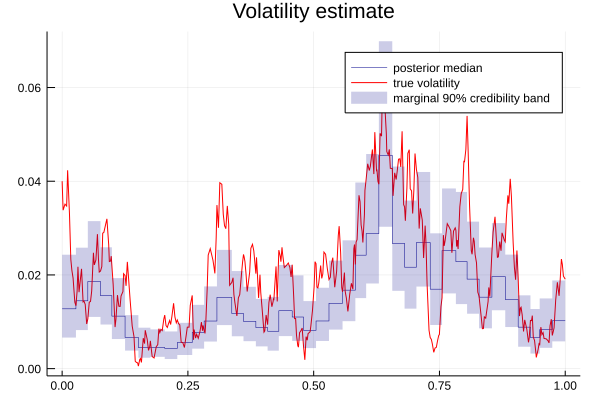

In [16]:
posterior = MicrostructureNoise.posterior_volatility(td, θs)

tt, mm = MicrostructureNoise.piecewise(posterior.post_t, posterior.post_median[:])

p = plot(tt, mm, label="posterior median", linewidth=0.5, color="dark blue")
plot!(t[1:10:end], (s0.(t[1:10:end])).^2, label="true volatility", color="red")


plot!(MicrostructureNoise.piecewise(posterior.post_t, posterior.post_qlow[:])...,
    fillrange = MicrostructureNoise.piecewise(posterior.post_t, posterior.post_qup[:])[2], 
    fillalpha = 0.2,
    alpha = 0.0,
    fillcolor="darkblue",
    title="Volatility estimate", label="marginal $(round(Int,posterior.qu*100))% credibility band")

display(p)


The greyish band mostly covers the red curve, the true volatility. Also the posterior median (blue line) globally follows the movement of the true volatility.

This is nice: Without any knowledge of the model, completely ignoring the drift, 
we still get a nice estimate and reasonable uncertainty quantification of the underlying volatility, and that having only indirect and 
noisy observations at our hand.

A histogram confirms that also the estimate of the observational noise is close to its true value.

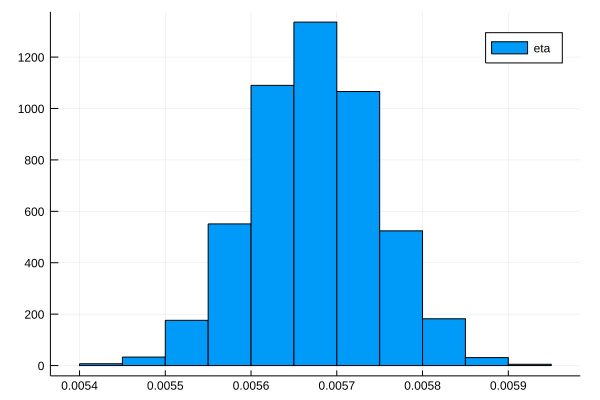

In [17]:
histogram(sqrt.(ηs[end÷2:end]), nbins=20, label="eta")

## References

* Shota Gugushvili, Frank van der Meulen, Moritz Schauer, and Peter Spreij: Nonparametric Bayesian volatility estimation. [arxiv:1801.09956](https://arxiv.org/abs/1801.09956), 2018.

* Shota Gugushvili, Frank van der Meulen, Moritz Schauer, and Peter Spreij: Nonparametric Bayesian volatility learning under microstructure noise. [arxiv:1805.05606](https://arxiv.org/abs/1805.05606), 2018.